## Image Classifier Project

### Step 1. 데이터셋 내려받기

In [1]:
import warnings
import tensorflow as tf
warnings.filterwarnings("ignore")


import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [2]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


### Step2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

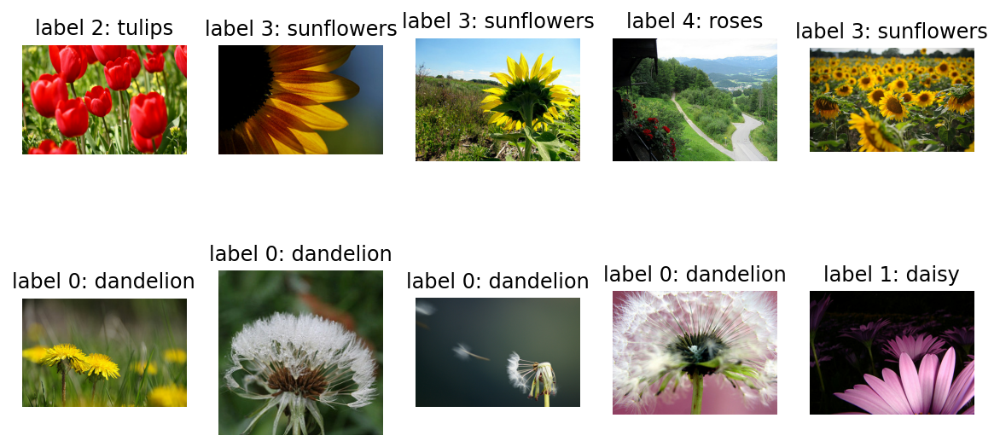

In [4]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [5]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [6]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

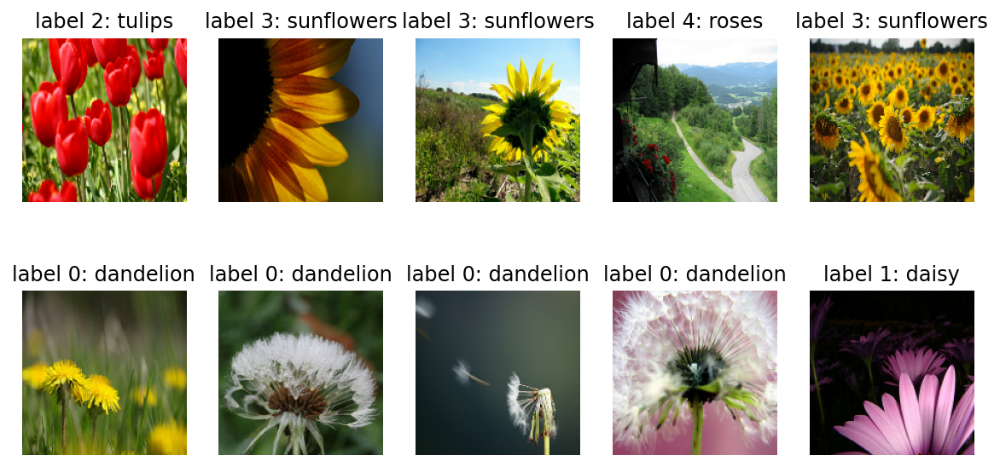

In [7]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [17]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape


feature_batch = base_model(image_batch)
feature_batch.shape


TensorShape([32, 5, 5, 512])

### step3. 모델 설계하기

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D


In [19]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')



In [20]:
import numpy as np


In [21]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [22]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [23]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
#dense_layer = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer='l2')

#prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [24]:
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 512)               262656    
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [25]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])


In [26]:
loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 8s 636ms/step - loss: 1.8909 - accuracy: 0.1580
initial loss: 1.89
initial accuracy: 0.16


### Step 4. 모델 학습시키기

In [27]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 84s 918ms/step - loss: 1.3969 - accuracy: 0.4942 - val_loss: 1.1782 - val_accuracy: 0.6485
Epoch 2/5
92/92 [==============================] - 85s 926ms/step - loss: 1.0618 - accuracy: 0.6958 - val_loss: 0.9437 - val_accuracy: 0.7112
Epoch 3/5
92/92 [==============================] - 85s 928ms/step - loss: 0.8802 - accuracy: 0.7415 - val_loss: 0.8050 - val_accuracy: 0.7193
Epoch 4/5
92/92 [==============================] - 84s 918ms/step - loss: 0.7734 - accuracy: 0.7667 - val_loss: 0.7199 - val_accuracy: 0.7439
Epoch 5/5
92/92 [==============================] - 83s 901ms/step - loss: 0.6996 - accuracy: 0.7779 - val_loss: 0.6892 - val_accuracy: 0.7493


In [28]:
#ephoch increase to 12
EPOCHS = 12   

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/12
92/92 [==============================] - 81s 881ms/step - loss: 0.6476 - accuracy: 0.7970 - val_loss: 0.6393 - val_accuracy: 0.7657
Epoch 2/12
92/92 [==============================] - 83s 898ms/step - loss: 0.6091 - accuracy: 0.8045 - val_loss: 0.6020 - val_accuracy: 0.7902
Epoch 3/12
92/92 [==============================] - 83s 900ms/step - loss: 0.5776 - accuracy: 0.8130 - val_loss: 0.5975 - val_accuracy: 0.7956
Epoch 4/12
92/92 [==============================] - 83s 902ms/step - loss: 0.5529 - accuracy: 0.8232 - val_loss: 0.5658 - val_accuracy: 0.8038
Epoch 5/12
92/92 [==============================] - 83s 902ms/step - loss: 0.5309 - accuracy: 0.8338 - val_loss: 0.5657 - val_accuracy: 0.8011
Epoch 6/12
92/92 [==============================] - 83s 902ms/step - loss: 0.5125 - accuracy: 0.8369 - val_loss: 0.5469 - val_accuracy: 0.8202
Epoch 7/12
92/92 [==============================] - 83s 902ms/step - loss: 0.4971 - accuracy: 0.8426 - val_loss: 0.5344 - val_accuracy: 0.8256

In [29]:
# learning rate to change
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


12/12 [==============================] - 7s 622ms/step - loss: 0.5018 - accuracy: 0.8283
initial loss: 0.50
initial accuracy: 0.83
Epoch 1/5
92/92 [==============================] - 80s 875ms/step - loss: 0.5331 - accuracy: 0.8116 - val_loss: 0.4953 - val_accuracy: 0.8120
Epoch 2/5
92/92 [==============================] - 82s 895ms/step - loss: 0.4520 - accuracy: 0.8399 - val_loss: 0.5533 - val_accuracy: 0.8011
Epoch 3/5
92/92 [==============================] - 83s 899ms/step - loss: 0.4118 - accuracy: 0.8549 - val_loss: 0.5278 - val_accuracy: 0.8256
Epoch 4/5
92/92 [==============================] - 82s 893ms/step - loss: 0.3777 - accuracy: 0.8624 - val_loss: 0.5479 - val_accuracy: 0.7902
Epoch 5/5
92/92 [==============================] - 82s 895ms/step - loss: 0.3477 - accuracy: 0.8753 - val_loss: 0.4817 - val_accuracy: 0.8474


In [30]:
# optimizer change to adam?
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

12/12 [==============================] - 7s 606ms/step - loss: 0.4817 - accuracy: 0.8474
initial loss: 0.48
initial accuracy: 0.85
Epoch 1/5
92/92 [==============================] - 80s 867ms/step - loss: 0.2600 - accuracy: 0.9145 - val_loss: 0.4235 - val_accuracy: 0.8420
Epoch 2/5
92/92 [==============================] - 4364s 47s/step - loss: 0.2474 - accuracy: 0.9203 - val_loss: 0.4237 - val_accuracy: 0.8556
Epoch 3/5
92/92 [==============================] - 83s 902ms/step - loss: 0.2411 - accuracy: 0.9223 - val_loss: 0.4307 - val_accuracy: 0.8556
Epoch 4/5
92/92 [==============================] - 82s 892ms/step - loss: 0.2380 - accuracy: 0.9251 - val_loss: 0.4266 - val_accuracy: 0.8501
Epoch 5/5
92/92 [==============================] - 83s 898ms/step - loss: 0.2326 - accuracy: 0.9285 - val_loss: 0.4287 - val_accuracy: 0.8529


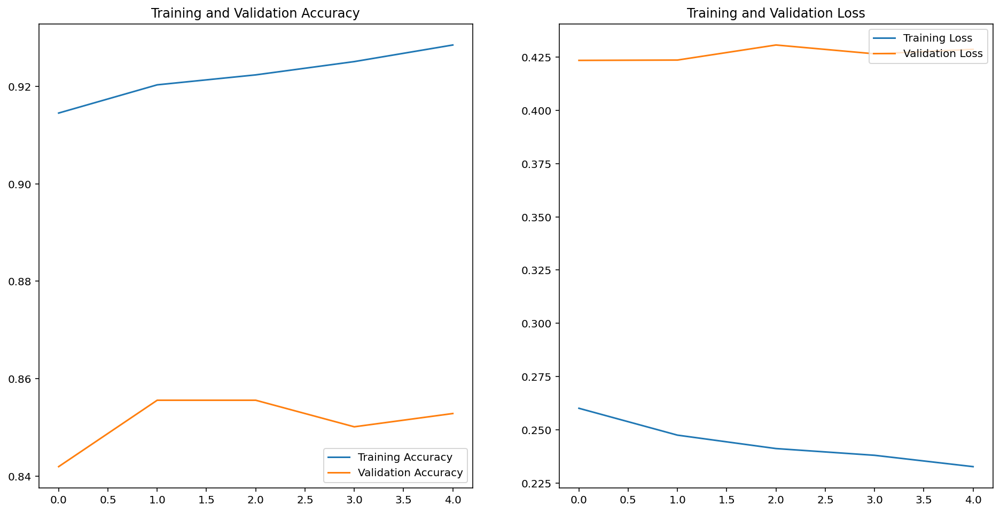

In [31]:
# learning progress visualize...
#학습과정 그래프 (가장 정확도가 높은 모델로 해봤습니다.)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [32]:
#예측결과 확인
loss0, accuracy0 = model.evaluate(test_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

#delete 
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

12/12 [==============================] - 8s 632ms/step - loss: 0.3778 - accuracy: 0.8692
initial loss: 0.38
initial accuracy: 0.87


array([[2.59992224e-03, 8.18901882e-03, 8.88749897e-01, 4.77066450e-03,
        9.56905410e-02],
       [9.99965429e-01, 3.35662698e-05, 2.21235030e-08, 1.97174103e-07,
        8.66348216e-07],
       [6.48967445e-01, 1.56285077e-01, 9.54860542e-03, 1.74778968e-01,
        1.04198437e-02],
       [1.29022577e-04, 3.94712290e-04, 6.59814894e-01, 2.41629939e-04,
        3.39419842e-01],
       [8.29400599e-01, 1.60914689e-01, 1.76292576e-03, 3.72917880e-03,
        4.19264426e-03],
       [9.83430982e-01, 1.18972110e-02, 3.41850944e-04, 4.24156152e-03,
        8.84429173e-05],
       [1.61857682e-03, 1.95657660e-04, 9.82707083e-01, 7.54655246e-03,
        7.93208182e-03],
       [1.80679172e-01, 8.11478734e-01, 2.09487371e-05, 7.69975595e-03,
        1.21319310e-04],
       [8.12862650e-04, 5.84385452e-05, 6.47007208e-03, 9.80857372e-01,
        1.18012652e-02],
       [9.99848127e-01, 1.50679829e-04, 2.67497136e-08, 1.09971222e-06,
        1.03663638e-07],
       [9.85762715e-01, 1.2863

In [33]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions


array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 1, 4, 4, 3, 0, 4])

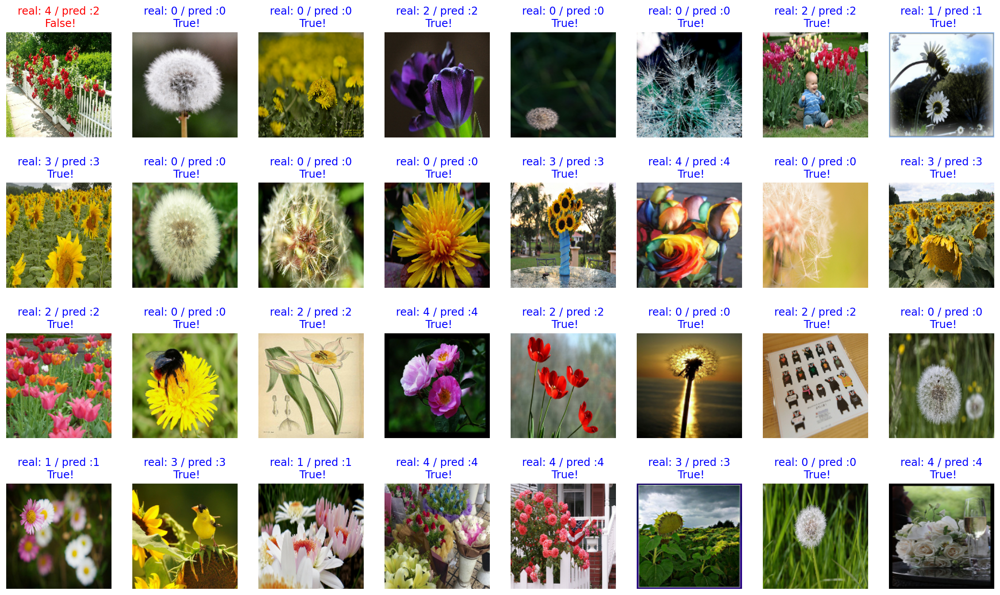

In [34]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [35]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    if label == prediction:
      count +=1     


print(count / 32 * 100)    # 약 70% 내외

96.875


In [36]:
#change to vgg19
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

feature_batch = base_model(image_batch)
feature_batch_average = global_average_layer(feature_batch)

dense_layer = tf.keras.layers.Dense(512, activation='relu')
#prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))

base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


12/12 [==============================] - 10s 804ms/step - loss: 1.7726 - accuracy: 0.1199
initial loss: 1.77
initial accuracy: 0.12
Epoch 1/5
92/92 [==============================] - 103s 1s/step - loss: 1.3827 - accuracy: 0.5106 - val_loss: 1.1850 - val_accuracy: 0.6866
Epoch 2/5
92/92 [==============================] - 104s 1s/step - loss: 1.0695 - accuracy: 0.6924 - val_loss: 0.9495 - val_accuracy: 0.7193
Epoch 3/5
92/92 [==============================] - 107s 1s/step - loss: 0.9011 - accuracy: 0.7204 - val_loss: 0.8305 - val_accuracy: 0.7466
Epoch 4/5
92/92 [==============================] - 106s 1s/step - loss: 0.8006 - accuracy: 0.7405 - val_loss: 0.7728 - val_accuracy: 0.7847
Epoch 5/5
92/92 [==============================] - 106s 1s/step - loss: 0.7334 - accuracy: 0.7626 - val_loss: 0.7215 - val_accuracy: 0.7766


In [37]:
# fc layer fine tuning
#change to 256 nodes
dense_layer = tf.keras.layers.Dense(256, activation='relu')

prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  


base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


12/12 [==============================] - 10s 800ms/step - loss: 2.4038 - accuracy: 0.1689
initial loss: 2.40
initial accuracy: 0.17
Epoch 1/5
92/92 [==============================] - 105s 1s/step - loss: 1.5371 - accuracy: 0.3740 - val_loss: 1.3172 - val_accuracy: 0.5749
Epoch 2/5
92/92 [==============================] - 105s 1s/step - loss: 1.2167 - accuracy: 0.6240 - val_loss: 1.1041 - val_accuracy: 0.6703
Epoch 3/5
92/92 [==============================] - 105s 1s/step - loss: 1.0401 - accuracy: 0.6911 - val_loss: 0.9864 - val_accuracy: 0.6703
Epoch 4/5
92/92 [==============================] - 106s 1s/step - loss: 0.9249 - accuracy: 0.7170 - val_loss: 0.8700 - val_accuracy: 0.7548
Epoch 5/5
92/92 [==============================] - 108s 1s/step - loss: 0.8399 - accuracy: 0.7360 - val_loss: 0.8058 - val_accuracy: 0.7575


In [38]:
# regularization
dense_layer = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer='l2')

prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  


base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


12/12 [==============================] - 10s 829ms/step - loss: 7.0234 - accuracy: 0.2044
initial loss: 7.02
initial accuracy: 0.20
Epoch 1/5
92/92 [==============================] - 107s 1s/step - loss: 5.8259 - accuracy: 0.4980 - val_loss: 5.0343 - val_accuracy: 0.6104
Epoch 2/5
92/92 [==============================] - 108s 1s/step - loss: 4.4591 - accuracy: 0.6649 - val_loss: 3.8787 - val_accuracy: 0.7302
Epoch 3/5
92/92 [==============================] - 108s 1s/step - loss: 3.4548 - accuracy: 0.7006 - val_loss: 3.0221 - val_accuracy: 0.7357
Epoch 4/5
92/92 [==============================] - 105s 1s/step - loss: 2.7184 - accuracy: 0.7285 - val_loss: 2.4216 - val_accuracy: 0.7548
Epoch 5/5
92/92 [==============================] - 106s 1s/step - loss: 2.1891 - accuracy: 0.7469 - val_loss: 1.9810 - val_accuracy: 0.7575


### Step5. 성능 평가

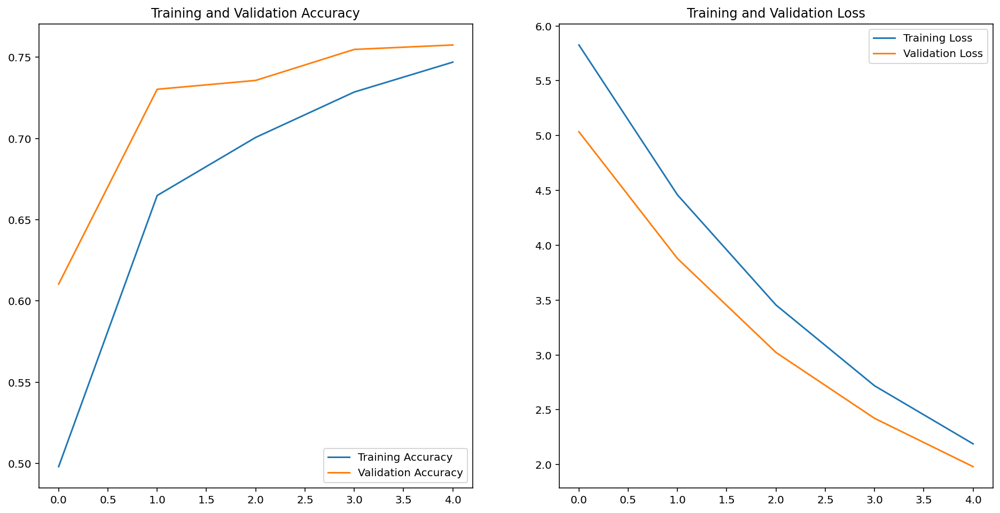

In [39]:
#학습과정 그래프
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [40]:
# validation_batches로 예측결과 확인
loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

#delete 
for image_batch, label_batch in validation_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

12/12 [==============================] - 10s 841ms/step - loss: 1.9810 - accuracy: 0.7575
initial loss: 1.98
initial accuracy: 0.76


array([[0.05933961, 0.21154994, 0.28501007, 0.16111316, 0.28298724],
       [0.02362992, 0.03239498, 0.85668147, 0.06065527, 0.02663832],
       [0.01597021, 0.03380072, 0.29908875, 0.20076254, 0.4503778 ],
       [0.10267107, 0.1368655 , 0.47448704, 0.18939008, 0.09658634],
       [0.31269747, 0.59818643, 0.0153558 , 0.06093896, 0.01282138],
       [0.09783406, 0.4616837 , 0.05543712, 0.17961341, 0.20543171],
       [0.1745085 , 0.10413987, 0.40819377, 0.19637053, 0.11678737],
       [0.00509314, 0.00844512, 0.95313156, 0.01788179, 0.01544838],
       [0.04663799, 0.01759737, 0.22407366, 0.30045298, 0.411238  ],
       [0.04792795, 0.06915314, 0.0603818 , 0.763568  , 0.05896917],
       [0.02349297, 0.03547298, 0.39211145, 0.17063387, 0.37828875],
       [0.02161597, 0.0287554 , 0.17872609, 0.62070775, 0.15019473],
       [0.06740104, 0.20464249, 0.10430412, 0.446227  , 0.17742534],
       [0.05146544, 0.04529381, 0.6750927 , 0.03605599, 0.1920921 ],
       [0.17112169, 0.10089125, 0.

In [41]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 2, 4, 2, 1, 1, 2, 2, 4, 3, 2, 3, 3, 2, 3, 0, 2, 0, 1, 0, 2, 2,
       4, 2, 1, 0, 2, 1, 0, 2, 0, 3])

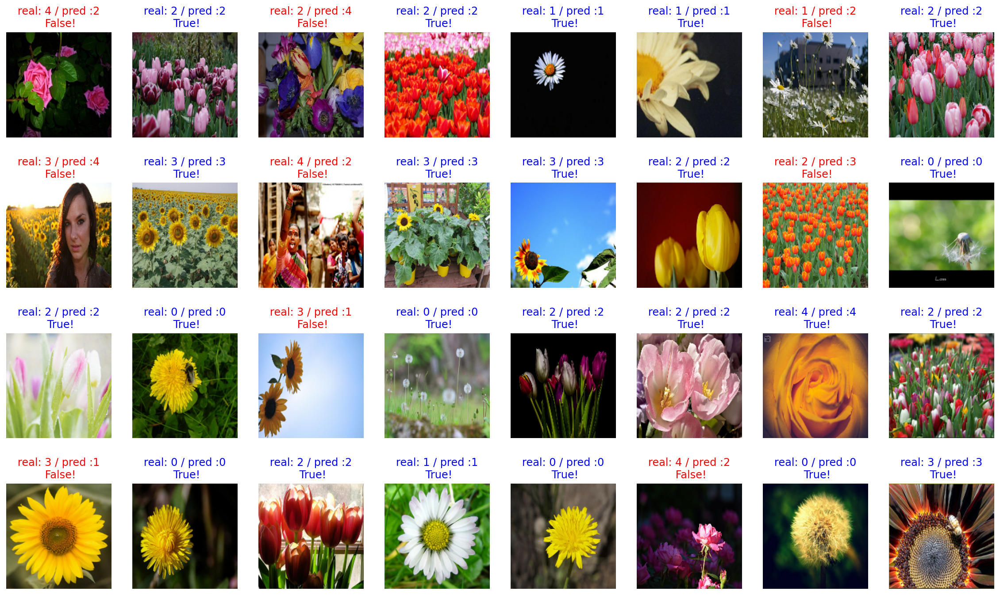

In [42]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [43]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    if label == prediction:
      count +=1     


print(count / 32 * 100)    # 약 70% 내외

71.875


In [44]:
# test_batches로 예측결과 확인
loss0, accuracy0 = model.evaluate(test_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions


12/12 [==============================] - 10s 846ms/step - loss: 2.0148 - accuracy: 0.7384
initial loss: 2.01
initial accuracy: 0.74


array([[0.08886216, 0.12214052, 0.4263919 , 0.26155937, 0.10104602],
       [0.909264  , 0.04547227, 0.00565142, 0.03195556, 0.00765672],
       [0.38623035, 0.1163937 , 0.10694195, 0.30155754, 0.08887642],
       [0.06467082, 0.0976169 , 0.40679324, 0.06495013, 0.36596882],
       [0.54894495, 0.21375345, 0.09462658, 0.0560398 , 0.08663522],
       [0.7944616 , 0.08917281, 0.03302428, 0.07094508, 0.01239623],
       [0.08341403, 0.07352553, 0.34364066, 0.37845978, 0.12095998],
       [0.28769863, 0.21102971, 0.04567717, 0.4042093 , 0.05138521],
       [0.01398694, 0.00976246, 0.05639907, 0.8584034 , 0.06144818],
       [0.9291954 , 0.02786648, 0.00449987, 0.03354236, 0.00489584],
       [0.90113264, 0.03745492, 0.01170106, 0.032406  , 0.01730527],
       [0.07009503, 0.3286122 , 0.08742817, 0.47876826, 0.03509623],
       [0.09013903, 0.05806537, 0.24778809, 0.41012055, 0.19388697],
       [0.0284577 , 0.06345025, 0.24463335, 0.18369159, 0.47976705],
       [0.82864463, 0.05458618, 0.

In [45]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 3, 3, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 4, 4, 2, 0,
       4, 0, 1, 3, 2, 4, 4, 3, 0, 4])

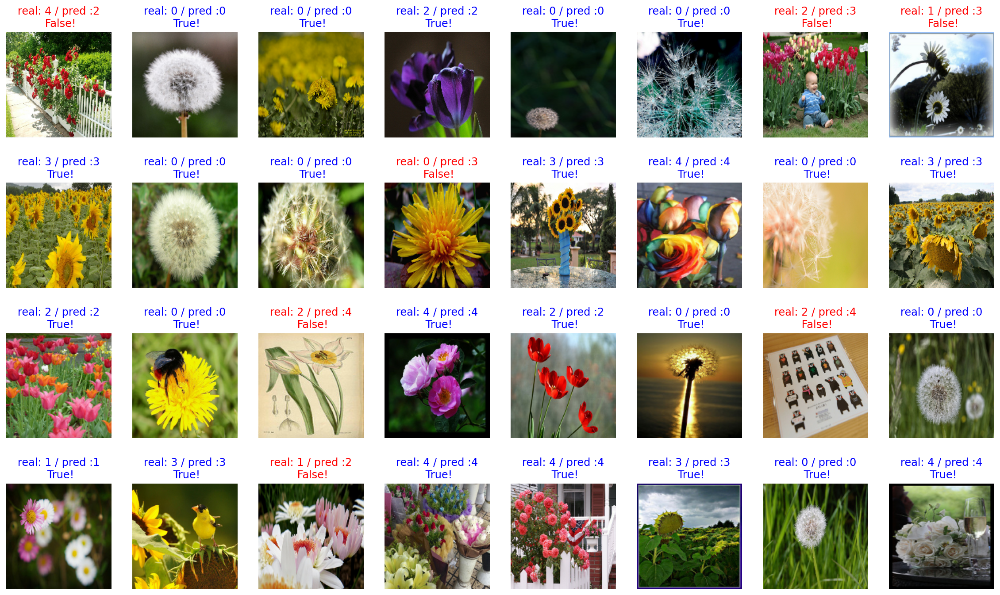

In [46]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [47]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    if label == prediction:
      count +=1     


print(count / 32 * 100)    # 약 70% 내외

78.125


### Step 6. 모델 활용하기

This image seems 99.0% dandelion,
          '0.0% daisy,
          0.0% tulips,
          1.0% sunflowers,
          and 0.0% roses


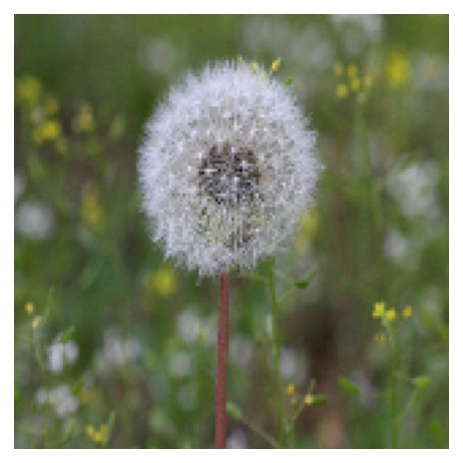

In [53]:
import os

img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

from tensorflow.keras.preprocessing.image import load_img, img_to_array

import PIL

IMG_SIZE = 160
flower_image_path = os.path.join(img_dir_path, 'flower1.png')

flower_image = load_img(flower_image_path, target_size=(IMG_SIZE, IMG_SIZE))
flower_image

flower_image = img_to_array(flower_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
flower_image.shape

prediction = model.predict(flower_image)
prediction

def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulips_percentage = round(prediction[2] * 100)
    sunflowers_percentage = round(prediction[3] * 100)
    roses_percentage = round(prediction[4] * 100)
    print(f"""This image seems {dandelion_percentage}% dandelion,
          '{daisy_percentage}% daisy,
          {tulips_percentage}% tulips,
          {sunflowers_percentage}% sunflowers,
          and {roses_percentage}% roses""")

filename = 'flower1.png'
show_and_predict_image(img_dir_path, filename)
    

- VGG16과 VGG19 등 이미 텐서 플로우가 제공하는 모델을 활용하여 쉽게 실습할 수 있었습니다.
- 학습 과정 그래프 그리기 및 인터넷에서 찾은 꽃 사진으로 실제 모델에 적용시켜보는 등의 실습을 할 수 있었습니다.
- Optimizer를 Adam으로 변경하는 것으로 가장 높은 정확도를 얻을 수 있었습니다. (테스트결과 96.875% 정확도)